### **Spatiotemporal Cell-type Redistribution and Inferred Cell-state Dynamics (Human Glioblastoma Organoids)**

In [1]:
options(warn = -1)
suppressPackageStartupMessages({
    library(Seurat)
    library(ggplot2)
    library(cowplot)
    library(patchwork)
    library(dplyr)
    library(tidyr)
    library(readxl)
    library(ggpubr)
    library(rstatix)
    library(readr)
    library(stringr)
})

In [2]:
#smpl_info = list(patient = '8167', TF0 = 'Tumor', TF1 = '2wk', TF2 = '24wk')
smpl_infos <- list(
    list(patient = '8036',  TF0 = 'Tumor', TF1 = '2wk', TF2 = '8wk'),
    list(patient = '8165C', TF0 = 'Tumor', TF1 = '2wk', TF2 = '24wk'),
    list(patient = '8165PV',TF0 = 'Tumor', TF1 = '2wk', TF2 = '24wk'),
    list(patient = '8167',  TF0 = 'Tumor', TF1 = '2wk', TF2 = '24wk')
)

### *Step 1 : Analysis of single-cell data*

###### **Preprocessing, QC, Dimensionality reduction**

In [3]:
cbarcodes <- read.csv('../Data/GSE141946_glioblastoma/GSE141946_scRNAseq.metadata.csv', header = FALSE)

sample_t0 <- read.table(paste0('../Data/GSE141946_glioblastoma/', smpl_info$patient, '_', smpl_info$TF0, '.txt'), header = TRUE, row.names = 1)
sample_t1 <- read.table(paste0('../Data/GSE141946_glioblastoma/', smpl_info$patient, '_', smpl_info$TF1, '.txt'), header = TRUE, row.names = 1)
sample_t2 <- read.table(paste0('../Data/GSE141946_glioblastoma/', smpl_info$patient, '_', smpl_info$TF2, '.txt'), header = TRUE, row.names = 1)

srt0 <- CreateSeuratObject(sample_t0, project = smpl_info$TF0, min.cells = 3)
srt1 <- CreateSeuratObject(sample_t1, project = smpl_info$TF1, min.cells = 3)
srt2 <- CreateSeuratObject(sample_t2, project = smpl_info$TF2, min.cells = 3)

merged_srt <- merge(srt0, c(srt1, srt2))
merged_srt@meta.data$patient <- cbarcodes[which(cbarcodes$V2 == smpl_info$patient),]$V2
merged_srt@meta.data$barcode <- cbarcodes[which(cbarcodes$V2 == smpl_info$patient),]$V4

merged_srt$orig.ident <- factor(x = merged_srt$orig.ident, levels = c(smpl_info$TF0, smpl_info$TF1, smpl_info$TF2))

# Remove all objects that will not be used.
rm(sample_t0, sample_t1, sample_t2, srt0, srt1, srt2)

# Run garbage collect to free up memory
gc(verbose = FALSE)

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,3789528,202.4,7025544,375.3,5284877,282.3
Vcells,25087624,191.5,507862995,3874.7,634168372,4838.4


In [4]:
merged_srt[['percent_mito']] <- PercentageFeatureSet(merged_srt, pattern = '^MT-')
merged_srt[['percent_ribo']] <- PercentageFeatureSet(merged_srt, pattern = '^RP[SL]')
merged_srt[['percent_hemo']] <- PercentageFeatureSet(merged_srt, pattern = '^HB[^(P)]')

options(repr.plot.height = 5, repr.plot.width = 20)
feats <- c("nFeature_RNA", "nCount_RNA", "percent_mito", "percent_ribo", "percent_hemo")

pdf(file = paste0("./1_scRNAseq/", smpl_info$patient, "_QC.pdf"), height = 5, width = 20, useDingbats=FALSE)
VlnPlot(merged_srt, features = feats, group.by = "orig.ident", pt.size = 0.1, ncol = 5) & theme(axis.title.x = element_blank())
plot_grid(FeatureScatter(merged_srt, "nCount_RNA", "nFeature_RNA", group.by = "orig.ident") + NoLegend(),
          FeatureScatter(merged_srt, "nCount_RNA", "percent_mito", group.by = "orig.ident") + NoLegend(), ncol = 2)
dev.off()

merged_srt <- merged_srt[!grepl("MALAT1", rownames(merged_srt)), ]        # Filter MALAT1
merged_srt <- merged_srt[!grepl("^MT-", rownames(merged_srt)), ]          # Filter Mitocondrial genes
merged_srt <- merged_srt[!grepl("^RP[SL]", rownames(merged_srt)), ]       # Filter Ribossomal genes
merged_srt <- merged_srt[!grepl("^HB[^(P)]", rownames(merged_srt)), ]     # Filter Hemoglobin genes

agg_record_3d4c7a5c274a 
                      2

###### **Cell-cycle scoring**

In [5]:
merged_srt[["RNA"]] <- JoinLayers(merged_srt[["RNA"]])
DefaultAssay(merged_srt) <- "RNA"

In [6]:
merged_srt <- NormalizeData(merged_srt, verbose = FALSE)
merged_srt <- CellCycleScoring(merged_srt, s.features = cc.genes$s.genes, g2m.features = cc.genes$g2m.genes)
merged_srt$CC.Difference <- merged_srt$S.Score - merged_srt$G2M.Score

options(repr.plot.height = 5, repr.plot.width = 20)
pdf(file = paste0("./1_scRNAseq/", smpl_info$patient, "_CS.pdf"), height = 5, width = 20, useDingbats=FALSE)
plot_grid(VlnPlot(merged_srt, features = c("S.Score", "G2M.Score", "CC.Difference"), group.by = "orig.ident") & theme(axis.title.x = element_blank()),
          FeatureScatter(merged_srt, "S.Score", "G2M.Score", group.by = "Phase"), rel_widths = c(3, 2))
dev.off()

agg_record_3d4ca266480 
                     2

###### **Doublet prediction**

agg_record_3d4c688763fd 
                      2

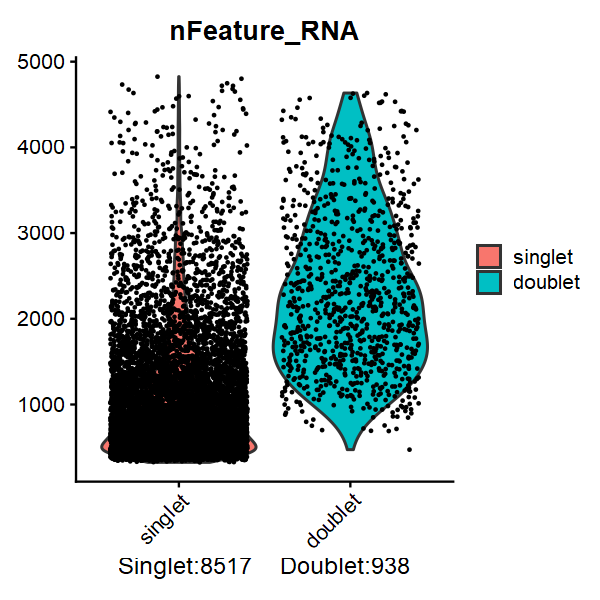

In [7]:
suppressPackageStartupMessages({
    library(scDblFinder)
    library(SingleCellExperiment)
})
sce <- as.SingleCellExperiment(merged_srt)
sce <- suppressMessages(scDblFinder(sce))
merged_srt <- as.Seurat(sce)
merged_srt$ident <- NULL

doublet.count = paste0("Singlet:", length(grep("singlet", merged_srt$scDblFinder.class)), "    ",
                       "Doublet:", length(grep("doublet", merged_srt$scDblFinder.class)))
options(repr.plot.height = 5, repr.plot.width = 5)
pdf(file = paste0("./1_scRNAseq/", smpl_info$patient, "_DP.pdf"), height = 5, width = 5, useDingbats=FALSE)
VlnPlot(merged_srt, features = "nFeature_RNA", group.by = "scDblFinder.class") & xlab(doublet.count)
dev.off()

VlnPlot(merged_srt, features = "nFeature_RNA", group.by = "scDblFinder.class") & xlab(doublet.count)

In [8]:
merged_srt <- subset(merged_srt, subset = scDblFinder.class  == "singlet")         # Remove doublets

###### **Batch Effect correction**

In [9]:
Elbow_vis <- function(object, return_plot = FALSE) {
    pct <- object[["pca"]]@stdev / sum(object[["pca"]]@stdev) * 100      # Determine percent of variation associated with each PC
    cumu <- cumsum(pct)                                                  # Calculate cumulative percents for each PC

    # Determine which PC exhibits cumulative percent greater than 90% and % variation associated with the PC as less than 5
    co1 <- which(cumu > 90 & pct < 5)[1]  
    # Determine the difference between variation of PC and subsequent PC, and last point where change of % of variation is more than 0.1%.
    co2 <- sort(which((pct[1:length(pct) - 1] - pct[2:length(pct)]) > 0.1), decreasing = T)[1] + 1

    pcs <- min(co1, co2)                                                 # Minimum of the two calculation

    plot_df <- data.frame(pct = pct, cumu = cumu, rank = 1:length(pct))  # Create a dataframe with values

    # Elbow plot to visualize 
    p <- ggplot(plot_df, aes(cumu, pct, label = rank, color = rank > pcs)) + geom_text() + geom_vline(xintercept = 90, color = "grey") + 
            geom_hline(yintercept = min(pct[pct > 5]), color = "grey") + geom_vline(xintercept = cumu[pcs], color = "red", linetype = "dashed") +
            labs(title = paste0("Elbow Plot - Selected PCs: ", pcs)) + theme_bw()

    if (return_plot) {
        return(p)
    } else {
        return(pcs)  
    }
}

agg_record_3d4c319268ab 
                      2

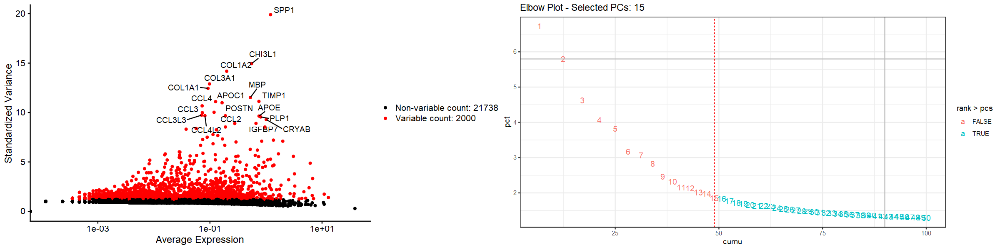

In [10]:
merged_srt <- FindVariableFeatures(merged_srt, selection.method = "vst", nfeatures = 2000, verbose = FALSE)
p1 <- LabelPoints(plot = VariableFeaturePlot(merged_srt), points = head(VariableFeatures(merged_srt), 20), xnudge = 0, ynudge = 0, repel = TRUE)

merged_srt <- ScaleData(merged_srt, vars.to.regress = c("nFeature_RNA", "percent_mito", "percent_ribo", "percent_hemo", "CC.Difference"), verbose = FALSE)
merged_srt <- RunPCA(merged_srt, features = VariableFeatures(merged_srt), npcs = 50, verbose = FALSE)
pcs <- Elbow_vis(merged_srt, return_plot = FALSE)
elbow_plot <- Elbow_vis(merged_srt, return_plot = TRUE)

options(repr.plot.height = 5, repr.plot.width = 20)
pdf(file = paste0("./1_scRNAseq/", smpl_info$patient, "_VF & Elbow.pdf"), height = 5, width = 20, useDingbats=FALSE)
plot_grid(p1, elbow_plot, ncol = 2)
dev.off()

plot_grid(p1, elbow_plot, ncol = 2)

In [11]:
merged_srt <- FindNeighbors(merged_srt, dims = 1:pcs, verbose = FALSE)
merged_srt <- RunUMAP(merged_srt, dims = 1:pcs, verbose = FALSE)

In [12]:
options(future.globals.maxSize = 8000 * 1024^2)

srtobj_list <- SplitObject(merged_srt, split.by = "orig.ident")
#for (i in 1:length(srtobj_list))
#    srtobj_list[[i]] <- srtobj_list[[i]] %>% NormalizeData(verbose = FALSE) %>% FindVariableFeatures(selection.method = "vst", nfeatures = 2000, verbose = FALSE)

hvgs_per_dataset <- lapply(srtobj_list, function(x) { x@assays$RNA@var.features })  # get the variable genes from all the datasets.
hvgs_per_dataset$all = VariableFeatures(merged_srt)                                 # add in the variable genes that was selected on the whole dataset
hvgs_all = SelectIntegrationFeatures(srtobj_list, nfeatures = 2000)
hvgs_per_dataset$all_ranks = hvgs_all

anchors <- FindIntegrationAnchors(srtobj_list, dims = 1:30, reduction = "cca", anchor.features = hvgs_all, verbose = FALSE)
afterINT <- IntegrateData(anchors, dims = 1:30, new.assay.name = "CCA", verbose = FALSE)

afterINT <- afterINT %>% ScaleData(verbose = FALSE) %>% RunPCA(verbose = FALSE) %>% FindNeighbors(dims = 1:pcs, verbose = FALSE) %>% RunUMAP(dims = 1:pcs, verbose = FALSE)
afterINT$orig.ident <- factor(x = afterINT$orig.ident, levels = c(smpl_info$TF0, smpl_info$TF1, smpl_info$TF2))

pdf(file = paste0("./1_scRNAseq/", smpl_info$patient, "_BE.pdf"), height = 5, width = 20, useDingbats=FALSE)
plot_grid(DimPlot(merged_srt, group.by="orig.ident") + plot_annotation(title = "Before integration"),
          DimPlot(afterINT, group.by="orig.ident") + plot_annotation(title = "After integration"), ncol = 2)
dev.off()

agg_record_3d4ca4c400b 
                     2

In [13]:
saveRDS(afterINT, file = paste0("./1_scRNAseq/", smpl_info$patient, "_INT.rds"), compress = TRUE)

###### **Clustering**

In [3]:
#rm(list = ls())
srtobj <- readRDS(paste0("./1_scRNAseq/", smpl_info$patient, "_INT.rds"))
#srtobj <- subset(srtobj, orig.ident == smpl_info$TF2)

In [4]:
srtobj <- FindClusters(srtobj, resolution = c(0.5, 0.8, 1), verbose = FALSE)

options(repr.plot.height = 5, repr.plot.width = 20)
pdf(file = paste0("./1_scRNAseq/", smpl_info$patient, "_MultiCL.pdf"), height = 5, width = 20, useDingbats=FALSE)
plot_grid(DimPlot(srtobj, group.by = "CCA_snn_res.0.5", label = TRUE, label.size = 5) + ggtitle("louvain_0.5"), 
          DimPlot(srtobj, group.by = "CCA_snn_res.0.8", label = TRUE, label.size = 5) + ggtitle("louvain_0.8"),
          DimPlot(srtobj, group.by = "CCA_snn_res.1", label = TRUE, label.size = 5) + ggtitle("louvain_1"), ncol = 3)
dev.off()

agg_record_1c6032f235bb 
                      2

In [5]:
Idents(srtobj) <- "CCA_snn_res.0.5"
DefaultAssay(srtobj) <- "RNA"
t(table(Idents(srtobj), srtobj$orig.ident))

       
          0   1   2   3   4   5   6   7   8   9  10  11
  Tumor 679 398 300 160 200 119 227 301 109 160  65  31
  2wk   311 296 482 266 142 124 190 112 128  23  18  60
  8wk   567 427 293 629 455 506 278 242 106  59  48   6

###### **DEGs**

In [6]:
DEG_table <- FindAllMarkers(srtobj, assay = "RNA", logfc.threshold = 0.25, only.pos = TRUE, min.pct = 0.1, verbose = FALSE)
DEG_table$diff.pct <- DEG_table$pct.1 - DEG_table$pct.2
DEG_table <- DEG_table %>% filter(!grepl("^MT-|^RP[SL]", gene)) %>% filter(avg_log2FC > 0.5, p_val_adj < 0.05)
top_markers <- as.data.frame(DEG_table %>% group_by(cluster) %>% arrange(desc(avg_log2FC), p_val_adj) %>% slice_head(n = 30) %>% ungroup())

write.csv(top_markers, file = paste0("./1_scRNAseq/", smpl_info$patient, "_TopMarkers.csv"), row.names = FALSE, col.names=TRUE)

In [7]:
all_clusters <- data.frame()

for (clust in unique(top_markers$cluster)) {
    cat("\n========== Cluster", clust, "==========\n")
    clustMarkers <- top_markers[top_markers$cluster == clust, c("gene", "avg_log2FC", "pct.1", "pct.2", "diff.pct", "p_val", "p_val_adj", "cluster")]
    all_clusters <- rbind(all_clusters, clustMarkers)
    cat("Top 10 markers:", paste(head(clustMarkers$gene, 10), collapse = ", "), "\n")
    
    p1 <- DimPlot(srtobj, pt.size = 0.5, label = TRUE, label.size = 5) & NoLegend() & NoAxes()
    p2 <- DotPlot(srtobj, features = clustMarkers$gene[1:25], dot.min = 0, col.min = 0) & RotatedAxis()
    p3 <- VlnPlot(srtobj, features = clustMarkers$gene[1:10], pt.size = 0, ncol = 5)
    p4 <- FeaturePlot(srtobj, features = clustMarkers$gene[1:10], label = TRUE, min.cutoff = "q10", ncol = 5)

    p_combined <- plot_grid(plot_grid(p1, p2, rel_widths = c(1, 3)), p3, p4, ncol = 1, rel_heights = c(1, 1.2, 1.2))
    pdf(file = paste0("./1_scRNAseq/", smpl_info$patient, "_ClusterPlots", clust, ".pdf"), height = 16, width = 20, useDingbats = FALSE)
    print(p_combined)
    dev.off()
}
write.csv(all_clusters, file = paste0("./1_scRNAseq/", smpl_info$patient, "_ClusterMarkers.csv"), row.names = FALSE, col.names=TRUE)


========== Cluster 0 ==========
Top 10 markers: NCAN, GFAP, LIX1, AQP4, PLP1, DCLK1, ID3, FAM107A, HMGCS1, F3 

========== Cluster 1 ==========
Top 10 markers: POSTN, KLHL4, PKIB, CD82, STK17A, SPATA6, ARL4A, METTL7B, EPN2, DBI 

========== Cluster 2 ==========
Top 10 markers: PLA2G2A, LTF, CP, CHI3L2, GALNT15, CFAP126, CA3, SERPING1, CAPS, MAOB 

========== Cluster 3 ==========
Top 10 markers: SPRY4, OLIG2, GAS1, OLIG1, FAT3, CD82, UBALD2, CHRNA1, CYTL1, ARC 

========== Cluster 4 ==========
Top 10 markers: MCM10, FAM111B, PCLAF, RRM2, TK1, CLSPN, CCNE2, ESCO2, CDCA5, CENPU 

========== Cluster 5 ==========
Top 10 markers: CA9, STC2, ANGPTL4, NDRG1, ADM, HILPDA, GPNMB, ERO1A, SLC2A1, GDF15 

========== Cluster 6 ==========
Top 10 markers: KIF20A, NEK2, DLGAP5, CCNB2, PLK1, TROAP, CCNB1, CDC20, PIF1, CENPA 

========== Cluster 7 ==========
Top 10 markers: PAK3, SSTR2, HSD11B2, AKNAD1, GADD45G, DLL3, ELAVL4, GRIK2, SEPT4, HES6 

========== Cluster 8 ==========
Top 10 markers: VGF, CHRN

###### **Cell-type identification**

In [ ]:
CellMarkerDB <- data.frame(read_xlsx("./Data/PanglaoDB.xlsx"))
CellMarkerDB <- data.frame(subset(CellMarkerDB, 
                                  species == 'Human' & tissue_class == 'Brain' & cancer_type == 'Glioblastoma', 
                                  select = c('species', 'tissue_class', 'tissue_type', 'cancer_type', 'cell_name', 'marker', 'Symbol','Genetype')))
#head(CellMarkerDB, 5)

In [ ]:
feats = cl$gene[1:30]
gene_marker <- CellMarkerDB[which(CellMarkerDB$marker %in% feats | CellMarkerDB$Symbol %in% feats),]
gene_marker
t(as.data.frame(table(gene_marker$cell_name)))

###### **Celltype annotation**

In [7]:
new.cluster.ids = c('0' = "OPCs",
                    '1' = "Proliferation",
                    '2' = "Neurons",
                    '3' = "Endothelial cells",
                    '4' = "Endothelial cells",
                    '5' = "Astrocytes",
                    '6' = "Proliferation",
                    '7' = "OPCs",
                    '8' = "Neurons",
                    '9' = "Macrophages/Microglia cells",
                    '10' = "Endothelial cells",
                    '11' = "Oligodendrocytes")
names(new.cluster.ids) = levels(srtobj)
srtobj = RenameIdents(srtobj, new.cluster.ids)
srtobj$cell_types <- as.character(srtobj@active.ident)

saveRDS(srtobj, file = paste0("./1_scRNAseq/", smpl_info$patient, "_Annotated.rds"), compress = TRUE)

pdf(file = paste0("./1_scRNAseq/", smpl_info$patient, "_Annotated.pdf"), width = 10, height = 10, onefile = TRUE)
DimPlot(srtobj, label = TRUE, label.size = 4, repel = TRUE)
dev.off()

agg_record_1c603e976813 
                      2

In [8]:
library(RColorBrewer)

pt <- as.data.frame(table(Idents(srtobj), srtobj$orig.ident))
pt$Var1 <- as.character(pt$Var1)
pt$Var2 <- factor(x = pt$Var2, levels = c(smpl_info$TF0, smpl_info$TF1, smpl_info$TF2))
pt <- pt %>% group_by(Var2) %>% mutate(percent = round(Freq / sum(Freq), 2))

options(repr.plot.height = 5, repr.plot.width = 20)
pdf(file = paste0("./1_scRNAseq/", smpl_info$patient, "_CTpercent.pdf"), width = 20, height = 5, onefile = TRUE)
ggplot(pt, aes(x = Var2, y = Freq, fill = Var1)) + coord_flip() + theme_bw(base_size = 15) + geom_col(position = "fill", width = 0.5) +
           geom_text(aes(label = scales::percent(percent)), size = 5, position = position_fill(vjust = 0.5), angle = 90) +
           xlab("Time frames") + ylab("Proportion") + scale_fill_manual(values = brewer.pal(12, "Paired")) + theme(legend.title = element_blank())
dev.off()

agg_record_1c603e437fe5 
                      2

### *Step 2 : Analysis of spatial data*

###### **Preprocessing, QC**

In [3]:
spatial_data = Load10X_Spatial("./Data/HumanGBM_10Xgenomics/",
                             "filtered_feature_bc_matrix.h5", assay = "Spatial", slice = "image", filter.matrix = TRUE)
spatial_data@meta.data$barcode <- row.names(spatial_data@meta.data)
spatial_data@meta.data <- spatial_data@meta.data[, c("orig.ident", "barcode", "nCount_Spatial", "nFeature_Spatial")]

In [4]:
spatial_data[['percent_mito']] <- PercentageFeatureSet(spatial_data, pattern = '^MT-')
spatial_data[['percent_ribo']] <- PercentageFeatureSet(spatial_data, pattern = '^RP[SL]')
spatial_data[['percent_hemo']] <- PercentageFeatureSet(spatial_data, pattern = '^HB[^(P)]')

options(repr.plot.height = 5, repr.plot.width = 20)
feats <- c("nFeature_Spatial", "nCount_Spatial", "percent_mito", "percent_ribo", "percent_hemo")
pdf(file = paste0("./Results/2_stRNAseq/Human_Glioblastoma_Whole_QC.pdf"), height = 5, width = 20, useDingbats=FALSE)
VlnPlot(spatial_data, features = feats, group.by = "orig.ident", pt.size = 0.1, ncol = 5) & theme(axis.title.x = element_blank())
plot_grid(FeatureScatter(spatial_data, "nCount_Spatial", "nFeature_Spatial", group.by = "orig.ident") + NoLegend(),
          FeatureScatter(spatial_data, "nCount_Spatial", "percent_mito", group.by = "orig.ident") + NoLegend(), ncol = 2)

spatial_data <- spatial_data[!grepl("MALAT1", rownames(spatial_data)), ]        # Filter MALAT1
spatial_data <- spatial_data[!grepl("^MT-", rownames(spatial_data)), ]          # Filter Mitocondrial genes
spatial_data <- spatial_data[!grepl("^RP[SL]", rownames(spatial_data)), ]       # Filter Ribossomal genes
spatial_data <- spatial_data[!grepl("^HB[^(P)]", rownames(spatial_data)), ]     # Filter Hemoglobin genes
spatial_data <- subset(spatial_data, subset = nFeature_Spatial < 8000 & nFeature_Spatial > 500 & nCount_Spatial < 35000 & percent_mito < 15 & percent_ribo < 20 & percent_hemo < 0.3)

VlnPlot(spatial_data, features = feats, group.by = "orig.ident", pt.size = 0.1, ncol = 5) & theme(axis.title.x = element_blank())
plot_grid(FeatureScatter(spatial_data, "nCount_Spatial", "nFeature_Spatial", group.by = "orig.ident") + NoLegend(),
          FeatureScatter(spatial_data, "nCount_Spatial", "percent_mito", group.by = "orig.ident") + NoLegend(), ncol = 2)
dev.off()

png 
  2

###### **Dimensionality reduction, Clustering**

In [5]:
spatial_data <- spatial_data %>% SCTransform(assay = "Spatial", vst.flavor = "v1", verbose = FALSE) %>%
                                 RunPCA(assay = "SCT", verbose = FALSE) %>% 
                                 FindNeighbors(dims = 1:30, verbose = FALSE) %>%
                                 FindClusters(verbose = FALSE) %>%
                                 RunUMAP(dims = 1:30, verbose = FALSE)

pdf(file = paste0("./Results/2_stRNAseq/Human_Glioblastoma_Whole_Clustered.pdf"), height = 5, width = 20, useDingbats=FALSE)
plot_grid(DimPlot(spatial_data, reduction = "umap", label = TRUE, label.size = 6, pt.size = 1),
          SpatialDimPlot(spatial_data, label = TRUE, label.size = 6, pt.size = 2) + NoLegend())
dev.off()
#SpatialDimPlot(stData, cells.highlight = CellsByIdentities(stData, idents = c(2, 1, 4, 3, 5, 8)), facet.highlight = TRUE, ncol = 6)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


png 
  2

###### **Identification of Spatially Variable Features (SVF)**

In [6]:
SpatiallyVariableFeatures_workaround <- function(object, assay="SCT", selection.method = "moransi") {
    #' This is work around function to replace SeuratObject::SpatiallyVariableFeatures function.
    #' return ranked list of Spatially Variable Features
    
    # Check if object is a Seurat object
    if (!inherits(object, "Seurat")) {
        stop("object must be a Seurat object")
    }
    
    # Check if assay is a valid assay
    if (!assay %in% names(object@assays)) {
        stop("assay must be a valid assay")
    }
    
    # Extract meta.features from the specified object and assay
    data <- object@assays[[assay]]@meta.features
    
    # Select columns starting with the provided col_prefix
    moransi_cols <- grep(paste0("^", selection.method), colnames(data), value = TRUE)
    
    # Filter rows where "moransi.spatially.variable" is TRUE
    filtered_data <- data[data[[paste0(selection.method, ".spatially.variable")]], moransi_cols]
    
    # Sort filtered data by "moransi.spatially.variable.rank" column in ascending order
    sorted_data <- filtered_data[order(filtered_data[[paste0(selection.method, ".spatially.variable.rank")]]), ]
    
    # Return row names of the sorted data frame
    rownames(sorted_data)
}

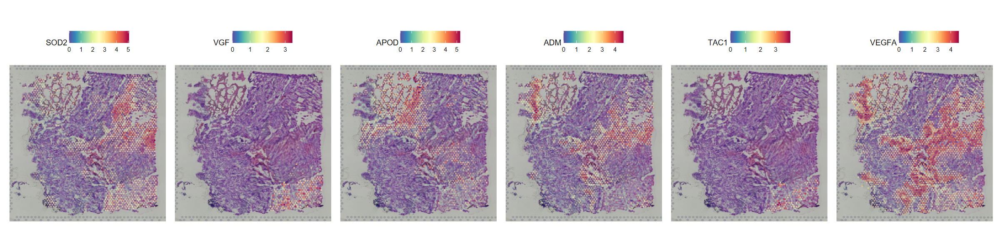

In [7]:
spatial_data <- FindSpatiallyVariableFeatures(spatial_data, assay = 'SCT', 
                                              features = VariableFeatures(spatial_data)[1:25], selection.method = 'moransi', verbose = FALSE)
top.features <- head(SpatiallyVariableFeatures_workaround(spatial_data, selection.method = 'moransi'), 6)
SpatialPlot(spatial_data, features = top.features, ncol = 6, alpha = c(0.1, 1))

In [8]:
saveRDS(spatial_data, file = paste0("./Results/2_stRNAseq/Human_Glioblastoma_Whole_SVF.rds"), compress = TRUE)

###### **DEGs**

In [ ]:
DEG_table <- FindAllMarkers(spatial_data, logfc.threshold = 0.1, only.pos = TRUE, verbose = FALSE)
DEG_table$diff.pct <- DEG_table$pct.1 - DEG_table$pct.2

In [ ]:
#top_markers <- as.data.frame(DEG_table %>% group_by(cluster) %>% top_n(-25, p_val_adj))
#top_markers <- as.data.frame(DEG_table %>% group_by(cluster) %>% top_n(25, diff.pct) %>% top_n(50, avg_log2FC) %>% top_n(-100, p_val_adj))
#top_markers <- as.data.frame(DEG_table %>% group_by(cluster) %>% top_n(-25, p_val_adj) %>% filter(avg_log2FC > 1))
top_markers <- as.data.frame(DEG_table %>% group_by(cluster) %>% dplyr::filter(avg_log2FC > 1) %>% slice_head(n = 25) %>% ungroup())

In [ ]:
cl = top_markers[which(top_markers$cluster == 15), ]
feat <- c('LPL', 'TNC', 'PON2', 'PLAT', 'SLC1A3')

options(repr.plot.height = 4, repr.plot.width = 20)
plot_grid(DimPlot(spatial_data, pt.size = 0.5, label = TRUE, label.size = 5) & NoLegend() & NoAxes(),
          DotPlot(spatial_data, features = cl$gene, dot.min = 0, col.min = 0) & RotatedAxis(), rel_widths = c(1, 4))

options(repr.plot.height = 7, repr.plot.width = 20)
VlnPlot(spatial_data, features = cl$gene[1:10], pt.size = 0, ncol = 5)
FeaturePlot(spatial_data, features = cl$gene[1:10], label = TRUE, min.cutoff = "q10", ncol = 5)
#VlnPlot(spatial_data, features = feat, pt.size = 0, ncol = 5)
#FeaturePlot(spatial_data, features = feat, label = TRUE, min.cutoff = "q10", ncol = 5)

In [ ]:
head(top_markers[which(top_markers$cluster == 15), ], 10)

In [ ]:
new.cluster.ids = c('0' = "Neurons",
                    '1' = "Endothelial cells", 
                    '2' = "Microglial cells", 
                    '3' = "Epithelial cells",
                    '4' = "Oligodendrocytes", 
                    '5' = "Astrocytes", 
                    '6' = "Neurons", 
                    '7' = "Neurons",
                    '8' = "Epithelial cells",
                    '9' = "Oligodendrocyte precursor cells",
                    '10'= "Fibroblasts")
names(new.cluster.ids) = levels(spatial_data)
spatial_data = RenameIdents(spatial_data, new.cluster.ids)
spatial_data$cell_types <- as.character(spatial_data@active.ident)

saveRDS(spatial_data, file = paste0("./Results/2_stRNAseq/Human_Glioblastoma_Whole_SVF.rds"), compress = TRUE)

pdf(file = paste0("./Results/2_stRNAseq/Human_Glioblastoma_Whole_SVF.pdf"), height = 5, width = 20, useDingbats=FALSE)
plot_grid(DimPlot(spatial_data, reduction = "umap", repel = TRUE, label = TRUE, label.size = 5),
          SpatialDimPlot(spatial_data, repel = TRUE, label = TRUE, label.size = 5))
dev.off()

### *Step 3 : Cell-type deconvolution using CARD*

###### **Loading of scRNA-seq and stRNA-seq data, Cell-type Deconvolution(CARD), Single Cell Resolution Mapping**

In [3]:
suppressPackageStartupMessages({
    library(CARD)
    library(SingleCellExperiment)
})

In [4]:
all_summaries <- list()
query <- readRDS("./2_stRNAseq/Human_Glioblastoma_Whole_SVF.rds")
#query <- UpdateSeuratObject(query)

for (smpl_info in smpl_infos) {
    reference_full <- readRDS(paste0("./1_scRNAseq/", smpl_info$patient, "_Annotated.rds"))
    timepoints <- c(smpl_info$TF0, smpl_info$TF1, smpl_info$TF2)

    pdf(file = paste0("./3_deconvolution/", smpl_info$patient, "_AllPlots.pdf"), height = 5, width = 20, useDingbats = FALSE)
    for (tp in timepoints) {
        smpl <- paste0(smpl_info$patient, "_", tp)
        reference <- reference_full[, reference_full$orig.ident == tp]
        
        ###### Plotting
        print(plot_grid(DimPlot(reference, label = TRUE, label.size = 3.5) & xlab("Single-cell dataset"),
                        DimPlot(query, label = TRUE, label.size = 5, repel = TRUE) & xlab("Spatial dataset"),
                        SpatialDimPlot(query, label = TRUE, label.size = 5, pt.size.factor = 2.5, repel = TRUE), ncol = 3))

        ###### Preparing required input data
        spatial_count <- query[["Spatial"]]$counts
        spatial_location <- GetTissueCoordinates(query)
        colnames(spatial_count) <- gsub(" ", "x", paste(spatial_location$x, spatial_location$y))
        rownames(spatial_location) <- gsub(" ", "x", paste(spatial_location$x, spatial_location$y))
        spatial_location$cell <- NULL

        sc_count <- reference[["RNA"]]$counts
        sc_meta <- reference@meta.data[, c('barcode', 'patient', 'orig.ident', 'cell_types')]
        sc_meta$cellID <- rownames(sc_meta)
        sc_meta <- sc_meta[, c('cellID', 'barcode', 'patient', 'orig.ident', 'cell_types')]
        colnames(sc_meta) <- c('cellID', 'barcode', 'patient', 'sampleInfo', 'cellType')

        ###### Cell Type Deconvolution
        invisible(capture.output({
            CARD_obj <- createCARDObject(sc_count, sc_meta, spatial_count, spatial_location, ct.varname = "cellType",
                                         ct.select = unique(sc_meta$cellType), sample.varname = "sampleInfo", minCountGene = 100, minCountSpot = 5)
            CARD_obj = suppressMessages(CARD_deconvolution(CARD_obj))
        }))

        ###### visualize the spatial distribution of the cell type proportion, enhanced resolution
        p1 <- CARD.visualize.prop(CARD_obj@Proportion_CARD, CARD_obj@spatial_location, sort(colnames(CARD_obj@Proportion_CARD)), NumCols = 10, pointSize = 0.5)
        invisible(capture.output({CARD_obj <- CARD.imputation(CARD_obj, NumGrids = 4000, ineibor = 10, exclude = NULL)}))
        location_imputation <- cbind.data.frame(x = as.numeric(sapply(strsplit(rownames(CARD_obj@refined_prop), split = "x"), "[", 1)),
                                                y = as.numeric(sapply(strsplit(rownames(CARD_obj@refined_prop), split = "x"), "[", 2)))
        rownames(location_imputation) <- rownames(CARD_obj@refined_prop)
        p2 <- CARD.visualize.prop(CARD_obj@refined_prop, location_imputation, sort(colnames(CARD_obj@refined_prop)), NumCols = 10, pointSize = 0.5)
        print(plot_grid(p1, p2, labels = c('Unrefined', 'Refined'), nrow = 2))
        CARD.visualize.Cor(CARD_obj@Proportion_CARD, colors = NULL)

        ###### All Samples CARDsummary
        n_spots <- nrow(CARD_obj@spatial_location)
        n_ref_cells <- nrow(sc_meta)
        prop_mat <- CARD_obj@Proportion_CARD
        celltype_abundance <- colSums(prop_mat)
        df <- data.frame(Sample = smpl, n_spatial_spots = n_spots, n_reference_cells = n_ref_cells, t(celltype_abundance), stringsAsFactors = FALSE, check.names = FALSE)
        all_summaries[[smpl]] <- df

        PropCARD <- cbind(CARD_obj@spatial_location, CARD_obj@Proportion_CARD)
        write.csv(PropCARD, file = paste0("./4_modelling/", smpl, "_PropCARD.csv"), row.names = FALSE)
        saveRDS(CARD_obj, file = paste0("./3_deconvolution/", smpl, ".rds"), compress = TRUE)
    }
    dev.off()
    message("Processing of patient ", smpl_info$patient, " data has been completed!!!")
}
final_summary <- bind_rows(all_summaries)
write.csv(final_summary, file = paste0("./3_deconvolution/AllSamples_CARDsummary.csv"), row.names = FALSE)

Processing of patient 8036 data has been completed!!!

Processing of patient 8165C data has been completed!!!

Processing of patient 8165PV data has been completed!!!

Processing of patient 8167 data has been completed!!!



In [4]:
for (smpl_info in smpl_infos) {
    CARDobj <- list()
    scMapping <- list()
    MapCellCords <- list()
    count_SC <- list()

    timepoints <- c(smpl_info$TF0, smpl_info$TF1, smpl_info$TF2)
    for (i in seq_along(timepoints)) {
        CARDobj[[i]] <- readRDS(paste0("./3_deconvolution/", smpl_info$patient, "_", timepoints[i], ".rds"))
        scMapping[[i]] <- CARD_SCMapping(CARDobj[[i]], shapeSpot = "Circle", numCell = 20, ncore = 1)

        MapCellCords[[i]] <- as.data.frame(colData(scMapping[[i]]))
        count_SC[[i]] <- assays(scMapping[[i]])$counts
    }
    
    CellLoc <- data.frame(x = MapCellCords[[1]]$x, y = MapCellCords[[1]]$y,
                          centerSPOT = MapCellCords[[1]]$centerSPOT, centerx = MapCellCords[[1]]$centerx, centery = MapCellCords[[1]]$centery)
    for(i in seq_along(timepoints)){
        CellLoc[[paste0("TF", i-1)]] <- i-1
        CellLoc[[paste0("TF", i-1, "_ct")]] <- MapCellCords[[i]]$CT
    }

    write.csv(CellLoc, file = paste0("./4_modelling/", smpl_info$patient, "_CellLoc.csv"), row.names = FALSE, col.names=TRUE)
    message("Processing of patient ", smpl_info$patient, " data has been completed!!!")
}

Processing of patient 8036 data has been completed!!!



### *Step 4 : Modeling of Spatiotemporal Cell-type Redistribution and Inferred Cell-state Dynamics*

In [3]:
load_patient <- function(patient_id, path) {
    PropCARDs <- list.files(path)
    
    cellloc_file <- PropCARDs[grepl(paste0("^", patient_id, "_CellLoc\\.csv$"), PropCARDs)]
    CellLoc <- read.csv(file.path(path, cellloc_file))

    patient_files <- PropCARDs[grepl(paste0("^", patient_id, "_.*_PropCARD\\.csv$"), PropCARDs)]
    
    timepoint_names <- sub(paste0("^", patient_id, "_(.*)_PropCARD\\.csv$"), "\\1", patient_files)
    wk <- suppressWarnings(as.numeric(sub("wk", "", timepoint_names)))
    ord <- order(timepoint_names != "Tumor", ifelse(is.na(wk), Inf, wk))
    patient_files   <- patient_files[ord]
    timepoint_names <- timepoint_names[ord]
    
    PropCARD <- lapply(patient_files, function(f) read.csv(file.path(path, f)))
    names(PropCARD) <- timepoint_names
    TFs <- PropCARD
    names(TFs) <- paste0("TF", seq_along(TFs)-1)

    celltypes <- sort(unique(unlist(lapply(TFs, function(df) setdiff(names(df), c("x","y"))))))
    final_cols <- c("x","y",celltypes)

    TFs <- lapply(TFs, function(df){
        missing_cols <- setdiff(final_cols, names(df))
        if(length(missing_cols) > 0){
            for(cl in missing_cols)
                df[[cl]] <- 0
        }
        df[, final_cols, drop = FALSE]
    })

    return(list(patient_id = patient_id, CellLoc = CellLoc, timepoint_names = timepoint_names, 
                celltypes = celltypes, timepoints = TFs, PropCARD = PropCARD))
}

In [4]:
patient <- load_patient(patient_id = "8167", path = "./4_modelling/")
CellLoc <- patient$CellLoc
timepoints <- patient$timepoints

##### **Spatiotemporal Cell-Type Redistribution and Inferred Cell-State Dynamics Visualization**

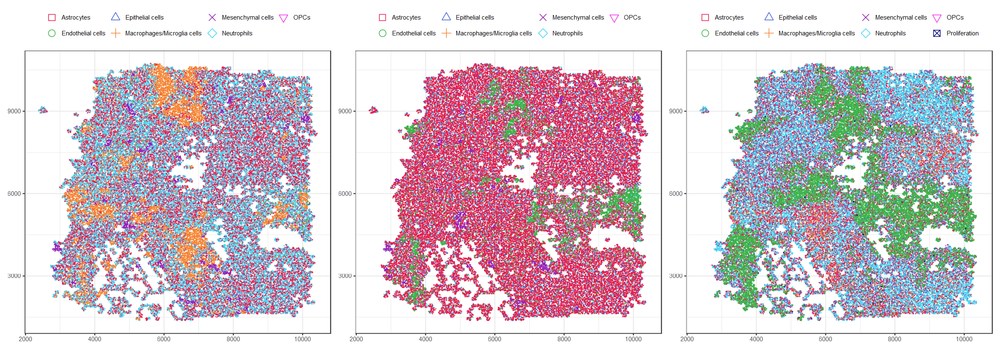

In [5]:
#CellLoc$matching <- (CellLoc$TF0_ct != CellLoc$TF1_ct) & (CellLoc$TF1_ct != CellLoc$TF2_ct) & (CellLoc$TF2_ct != CellLoc$TF0_ct)
#CellLoc <- CellLoc[which(CellLoc$matching == TRUE), ]

t0 <- strsplit(sort(unique(CellLoc$TF0_ct), decreasing = FALSE), split = "[.]")
t1 <- strsplit(sort(unique(CellLoc$TF1_ct), decreasing = FALSE), split = "[.]")
t2 <- strsplit(sort(unique(CellLoc$TF2_ct), decreasing = FALSE), split = "[.]")
idx <- which.max(lengths(list(t0, t1, t2)))
colors <- c('#e6194B', '#3cb44b', '#4363d8', '#f58231', '#911eb4', '#42d4f4', '#f032e6', '#000075', '#9A6324', '#800000', '#000000', '#469990')
shapes <- c('square open', 'circle open', 'triangle open', 'plus', 'cross', 'diamond open', 'triangle down open', 'square cross', 'asterisk', 'diamond plus', 'circle plus')
pointColors <- setNames(colors, list(t0, t1, t2)[[idx]])
pointShapes <- setNames(shapes, list(t0, t1, t2)[[idx]])

p1 <- ggplot() + geom_point(CellLoc, mapping=aes(x, y, shape=TF0_ct, color=TF0_ct), size=.001) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
p2 <- ggplot() + geom_point(CellLoc, mapping=aes(x, y, shape=TF1_ct, color=TF1_ct), size=.001) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
p3 <- ggplot() + geom_point(CellLoc, mapping=aes(x, y, shape=TF2_ct, color=TF2_ct), size=.001) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)

options(repr.plot.height = 7, repr.plot.width = 20)
p1 + p2 + p3 + plot_layout(ncol = 3)

In [6]:
ctTF0 <- c(sort(unique(CellLoc$TF0_ct), decreasing = FALSE))
ctTF1 <- c(sort(unique(CellLoc$TF1_ct), decreasing = FALSE))
ctTF2 <- c(sort(unique(CellLoc$TF2_ct), decreasing = FALSE))

length(ctTF0) <- length(ctTF1) <- length(ctTF2) <- max(length(ctTF0), length(ctTF1), length(ctTF2))                      
ctList <- as.data.frame(cbind(ctTF0, ctTF1, ctTF2))
colnames(ctList) <- c('Celltypes of TF0', 'Celltypes of TF1', 'Celltypes of TF2')
ctList[is.na(ctList)] <- ""
ctList

Celltypes of TF0,Celltypes of TF1,Celltypes of TF2
<chr>,<chr>,<chr>
Astrocytes,Astrocytes,Astrocytes
Endothelial cells,Endothelial cells,Endothelial cells
Epithelial cells,Epithelial cells,Epithelial cells
Macrophages/Microglia cells,Macrophages/Microglia cells,Macrophages/Microglia cells
Mesenchymal cells,Mesenchymal cells,Mesenchymal cells
Neutrophils,Neutrophils,Neutrophils
OPCs,OPCs,OPCs
,,Proliferation


###### *Spatiotemporal Cell-Type Redistribution*

In [7]:
DF0 <- filter(CellLoc, TF0_ct %in% c('Endothelial cells'))
DF1 <- filter(CellLoc, TF1_ct %in% c('Endothelial cells'))
DF2 <- filter(CellLoc, TF2_ct %in% c('Endothelial cells'))
if (nrow(DF0) != 0 & nrow(DF1) != 0 & nrow(DF2) != 0){
    p1 <- ggplot(DF0, aes(x, y, shape=TF0_ct, color=TF0_ct)) + geom_point(size=1) + theme_bw() + labs(caption = paste0("Number of cells: ", nrow(DF0))) + theme(plot.caption = element_text(size = 12), legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
    p2 <- ggplot(DF1, aes(x, y, shape=TF1_ct, color=TF1_ct)) + geom_point(size=1) + theme_bw() + labs(caption = paste0("Number of cells: ", nrow(DF1))) + theme(plot.caption = element_text(size = 12), legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
    p3 <- ggplot(DF2, aes(x, y, shape=TF2_ct, color=TF2_ct)) + geom_point(size=1) + theme_bw() + labs(caption = paste0("Number of cells: ", nrow(DF2))) + theme(plot.caption = element_text(size = 12), legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)

    tmp0 = select(DF0, c(x, y, centerSPOT, centerx, centery, TF0, TF0_ct))
    tmp1 = select(DF1, c(x, y, centerSPOT, centerx, centery, TF1, TF1_ct))
    tmp2 = select(DF2, c(x, y, centerSPOT, centerx, centery, TF2, TF2_ct))
    colnames(tmp2)=colnames(tmp1)=colnames(tmp0)
    CellMig = rbind(tmp0, tmp1, tmp2)
    row.names(CellMig) <- seq.int(nrow(CellMig))
    colnames(CellMig) <- c('x', 'y', 'centerSPOT', 'centerx', 'centery', 'TF', 'TF_ct')
    ps <- ggplot() + geom_point(CellMig, mapping = aes(x, y, shape=TF_ct, color=TF_ct), size=1) + theme_bw() + labs(caption = paste0('All time frames of ', DF0$TF0_ct[[1]])) + theme(plot.caption = element_text(size = 12), legend.position="none", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
}
options(repr.plot.height = 7, repr.plot.width = 20)
pdf(file = paste0("./Final_outputs/8167_Redist.pdf"), height = 6, width = 20, useDingbats=FALSE)
p1 + p2 + p3 + plot_layout(ncol = 4)
dev.off()

suppressPackageStartupMessages({
    library(gganimate)
    theme_set(theme_bw())
})
animp <- ps + transition_time(CellMig$TF) + ease_aes('linear') + labs(title = "Time frame: {frame_time}") + shadow_wake(wake_length = 1) 
animate(animp, nframes = max(CellMig$TF) - min(CellMig$TF) + 1, fps = 1, duration = 3, 
        renderer = gifski_renderer(paste0('./Final_outputs/8167.gif')))

agg_record_324471cd7180 
                      2


Rendering [==============>-------------------------------] at 3 fps ~ eta:  1s

Rendering [============================>---------------] at 1.3 fps ~ eta:  1s

Rendering [===========================================] at 0.98 fps ~ eta:  0s
                                                                              



###### *Inferred Cell-State Dynamics*

In [8]:
transitions_freq <- CellLoc %>%
    filter(TF0_ct != TF1_ct | TF1_ct != TF2_ct) %>%
    group_by(TF0_ct, TF1_ct, TF2_ct) %>%
    summarise(count = n(), .groups = 'drop') %>%
    arrange(desc(count))

print(transitions_freq)

if(nrow(transitions_freq) > 0) {
    cat("=", rep("=", 60), "\n", sep="")
    for(i in 1:min(20, nrow(transitions_freq))) {  # Show top 20 combinations
        cat(sprintf("%2d. %s → %s → %s (Number: %d)\n", 
                    i,
                    transitions_freq$TF0_ct[i], 
                    transitions_freq$TF1_ct[i], 
                    transitions_freq$TF2_ct[i],
                    transitions_freq$count[i]))
    }
}

# A tibble: 219 × 4
   TF0_ct                      TF1_ct     TF2_ct            count
   <chr>                       <chr>      <chr>             <int>
 1 Neutrophils                 Astrocytes Neutrophils        8507
 2 Astrocytes                  Astrocytes Neutrophils        7240
 3 Neutrophils                 Astrocytes Astrocytes         6080
 4 Neutrophils                 Astrocytes Endothelial cells  3556
 5 Astrocytes                  Astrocytes Endothelial cells  2941
 6 Macrophages/Microglia cells Astrocytes Neutrophils        2506
 7 Macrophages/Microglia cells Astrocytes Astrocytes         2264
 8 Neutrophils                 Astrocytes Epithelial cells   1490
 9 Astrocytes                  Astrocytes Epithelial cells   1281
10 Macrophages/Microglia cells Astrocytes Endothelial cells  1280
# ℹ 209 more rows
 1. Neutrophils → Astrocytes → Neutrophils (Number: 8507)
 2. Astrocytes → Astrocytes → Neutrophils (Number: 7240)
 3. Neutrophils → Astrocytes → Astrocytes (Number: 6080

In [9]:
# Definition of logical combinations from a biological perspective
logical_transitions <- c(
    # Inflammation and immunity
    "Neutrophils → Macrophages/Microglia cells → Astrocytes",
    "Neutrophils → Macrophages/Microglia cells → Proliferation",
    "Macrophages/Microglia cells → Neutrophils → Proliferation",
    "Neutrophils → Macrophages/Microglia cells → OPCs",
    
    # Tissue repair and angiogenesis
    "Mesenchymal cells → Endothelial cells → Proliferation",
    "Mesenchymal cells → Endothelial cells → Endothelial cells",
    "Macrophages/Microglia cells → Mesenchymal cells → Endothelial cells",
    "Macrophages/Microglia cells → Mesenchymal cells → Epithelial cells",
    
    # Cell differentiation
    "OPCs → Astrocytes → Proliferation",
    "OPCs → Astrocytes → Astrocytes",
    "OPCs → Astrocytes → Endothelial cells",
    
    # EMT و MET
    "Epithelial cells → Mesenchymal cells → Endothelial cells",
    "Epithelial cells → Mesenchymal cells → Proliferation",
    "Mesenchymal cells → Epithelial cells → Proliferation",
    
    # Astrocyte activation
    "Neutrophils → Astrocytes → Proliferation",
    "Macrophages/Microglia cells → Astrocytes → Proliferation",
    "Astrocytes → Astrocytes → Proliferation",
    
    # Vascular response
    "Endothelial cells → Endothelial cells → Proliferation",
    "Endothelial cells → Proliferation → Endothelial cells"
)

logical_transitions_freq <- CellLoc %>%
    filter(TF0_ct != TF1_ct | TF1_ct != TF2_ct) %>%
    mutate(transition = paste(TF0_ct, "→", TF1_ct, "→", TF2_ct)) %>%
    filter(transition %in% logical_transitions) %>%
    group_by(TF0_ct, TF1_ct, TF2_ct, transition) %>%
    summarise(count = n(), .groups = 'drop') %>%
    arrange(desc(count))

# Results
cat("\nMost frequent biological logical combinations:\n")
cat(paste(rep("=", 70), collapse = ""), "\n")

if(nrow(logical_transitions_freq) > 0) {
    for(i in 1:nrow(logical_transitions_freq)) {
        cat(sprintf("%2d. %-60s Number: %d\n", 
                    i,
                    logical_transitions_freq$transition[i],
                    logical_transitions_freq$count[i]))
    }
} else {
    cat("No logical combination found.\n")
}


Most frequent biological logical combinations:
 1. Neutrophils → Macrophages/Microglia cells → Astrocytes   Number: 141
 2. Neutrophils → Astrocytes → Proliferation                 Number: 27
 3. Astrocytes → Astrocytes → Proliferation                  Number: 17
 4. Macrophages/Microglia cells → Astrocytes → Proliferation Number: 10
 5. OPCs → Astrocytes → Endothelial cells                    Number: 9
 6. Macrophages/Microglia cells → Mesenchymal cells → Endothelial cells Number: 8
 7. Neutrophils → Macrophages/Microglia cells → OPCs         Number: 6
 8. Macrophages/Microglia cells → Mesenchymal cells → Epithelial cells Number: 5
 9. Macrophages/Microglia cells → Neutrophils → Proliferation Number: 4
10. Mesenchymal cells → Endothelial cells → Endothelial cells Number: 3
11. OPCs → Astrocytes → Astrocytes                           Number: 3


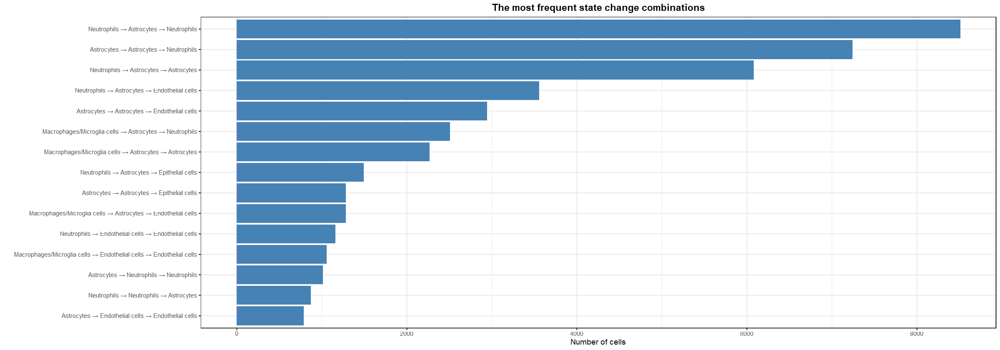

In [10]:
library(ggplot2)

top_transitions <- transitions_freq %>%
    head(15) %>%
    mutate(transition = paste(TF0_ct, "→", TF1_ct, "→", TF2_ct))

ggplot(top_transitions, aes(x = reorder(transition, count), y = count)) +
    geom_bar(stat = "identity", fill = "steelblue") +
    coord_flip() +
    theme_bw(base_size = 11) +
    labs(x = "", y = "Number of cells", 
         title = "The most frequent state change combinations") +
    theme(plot.title = element_text(hjust = 0.5, face = "bold"))

In [12]:
DF <- filter(CellLoc, TF0_ct %in% c('Neutrophils') & TF1_ct %in% c('Macrophages/Microglia cells') & TF2_ct %in% c('Astrocytes'))

if (nrow(DF) != 0){
    p1 <- ggplot(DF, aes(x, y, shape=TF0_ct, color=TF0_ct)) + geom_point(size=.5) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
    p2 <- ggplot(DF, aes(x, y, shape=TF1_ct, color=TF1_ct)) + geom_point(size=.5) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
    p3 <- ggplot(DF, aes(x, y, shape=TF2_ct, color=TF2_ct)) + geom_point(size=.5) + theme_bw() + theme(legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)

    tmp0 = select(DF, c(x, y, centerSPOT, centerx, centery, TF0, TF0_ct))
    tmp1 = select(DF, c(x, y, centerSPOT, centerx, centery, TF1, TF1_ct))
    tmp2 = select(DF, c(x, y, centerSPOT, centerx, centery, TF2, TF2_ct))
    colnames(tmp2)=colnames(tmp1)=colnames(tmp0)
    CellMig = rbind(tmp0, tmp1, tmp2)
    row.names(CellMig) <- seq.int(nrow(CellMig))
    colnames(CellMig) <- c('x', 'y', 'centerSPOT', 'centerx', 'centery', 'TF', 'TF_ct')
    pd <- ggplot() + geom_point(CellMig, mapping = aes(x, y, shape=TF_ct, color=TF_ct), size=.5) + theme_bw() + labs(caption = paste0("Number of cells in all time frames: ", nrow(DF))) + theme(plot.caption = element_text(size = 14), legend.position="top", legend.title=element_blank(), axis.title.x = element_blank(), axis.title.y = element_blank()) + guides(shape = guide_legend(override.aes = list(size = 4))) + scale_colour_manual(values =  pointColors) + scale_shape_manual(values = pointShapes)
}
options(repr.plot.height = 6, repr.plot.width = 20)
pdf(file = paste0("./Final_outputs/8167_CellState.pdf"), height = 6, width = 20, useDingbats=FALSE)
p1 + p2 + p3 + pd + plot_layout(ncol = 4)
dev.off()

agg_record_32443a6e7e33 
                      2

In [14]:
library(plotly)
library(webshot2)
library(htmlwidgets)

all_types <- sort(unique(c(CellLoc$TF0_ct, CellLoc$TF1_ct, CellLoc$TF2_ct)))
pointColors <- setNames(colors[1:length(all_types)], all_types)
pointShapes <- setNames(shapes[1:length(all_types)], all_types)

DF <- filter(CellLoc, TF0_ct %in% c('Neutrophils') & TF1_ct %in% c('Macrophages/Microglia cells') & TF2_ct %in% c('Astrocytes'))

if (nrow(DF) != 0){
    tmp0 <- DF %>% select(x, y, TF0, TF0_ct) %>% mutate(z = 0, TF_ct = TF0_ct)
    tmp1 <- DF %>% select(x, y, TF1, TF1_ct) %>% mutate(z = 1, TF_ct = TF1_ct)
    tmp2 <- DF %>% select(x, y, TF2, TF2_ct) %>% mutate(z = 2, TF_ct = TF2_ct)

    CellMig <- bind_rows(tmp0, tmp1, tmp2)
    CellMig$TF_ct <- factor(CellMig$TF_ct, levels = names(pointColors))

    fig <- plot_ly(
        CellMig, x = ~x, y = ~y, z = ~z,
        color = ~TF_ct, colors = pointColors,
        symbol = ~TF_ct, symbols = pointShapes,
        type = 'scatter3d', mode = 'markers',
        marker = list(size = 2)
    )

    fig <- fig %>% layout(
        scene = list(
            xaxis = list(title = "", showticklabels = FALSE, showgrid = TRUE, zeroline = FALSE),
            yaxis = list(title = "", showticklabels = FALSE, showgrid = TRUE, zeroline = FALSE),
            zaxis = list(
                title = "",
                tickmode = "array",
                tickvals = c(0, 1, 2)
                #ticktext = c("Time t=0", "Time t=1", "Time t=2")
            )
        ),
        legend = list(title = list(text = ""))
    )
    library(pandoc)

    tmp_html <- tempfile(fileext = ".html")
    htmlwidgets::saveWidget(fig, file = tmp_html, selfcontained = FALSE)

    png_file <- "./Final_outputs/CellMigration3D.png"
    webshot::webshot(
        url = "./Final_outputs/CellMigration3D.html",
        file = "./Final_outputs/CellMigration3D.png",
        vwidth = 4000,
        vheight = 4000,
        zoom = 5,
        delay = 3
    )

    fig
}

#webshot2::webshot(url = "./Final_outputs/CellMigration3D.html", file = "./Final_outputs/CellMigration3D.png", vwidth = 4000, vheight = 4000, zoom = 5, delay = 3)

HTML widgets cannot be represented in plain text (need html)

##### **Statistical analysis**

###### *Spatiotemporal Cell-type Redistribution*

In [5]:
###############################################################
## Calculate weighted centroids
calculate_centroids <- function(timepoints){
    celltypes <- setdiff(names(timepoints[[1]]), c("x","y"))
    res <- list()
    k <- 1
    for(tp in names(timepoints)){
        df <- timepoints[[tp]]
        for(ct in celltypes){
            w <- df[[ct]]
            ## Ignore empty abundance
            if(sum(w, na.rm = TRUE) == 0){
                cx <- NA
                cy <- NA
                total <- 0

                dispersion <- NA

                VarX <- NA
                VarY <- NA
                CovXY <- NA

                MajorAxis <- NA
                MinorAxis <- NA
                Angle <- NA

            }else{
                total <- sum(w, na.rm = TRUE)

                cx <- weighted.mean(df$x, w, na.rm = TRUE)
                cy <- weighted.mean(df$y, w, na.rm = TRUE)

                dx <- df$x - cx
                dy <- df$y - cy

                dispersion <- sqrt(sum(w * (dx^2 + dy^2), na.rm = TRUE) / total)

                VarX <- sum(w * dx^2, na.rm = TRUE) / total
                VarY <- sum(w * dy^2, na.rm = TRUE) / total
                CovXY <- sum(w * dx * dy, na.rm = TRUE) / total

                eig <- eigen(matrix(c(VarX, CovXY, CovXY, VarY), nrow = 2))

                MajorAxis <- sqrt(max(eig$values))
                MinorAxis <- sqrt(min(eig$values))

                Angle <- atan2(eig$vectors[2,1], eig$vectors[1,1]) * 180 / pi
            }
            res[[k]] <- data.frame(Time = tp, CellType = ct, CentroidX = cx, CentroidY = cy, TotalAbundance = total, Dispersion = dispersion,
                                   VarX = VarX, VarY = VarY, CovXY = CovXY, MajorAxis = MajorAxis, MinorAxis = MinorAxis, Angle = Angle, stringsAsFactors = FALSE)
            k <- k + 1
        }
    }
    dplyr::bind_rows(res)
}
Centroids <- calculate_centroids(timepoints)

In [6]:
###############################################################
## Tissue Diameter
all_coords <- bind_rows(lapply(timepoints,function(x){x[,c("x","y")]}))
TissueDiameter <- sqrt((max(all_coords$x)-min(all_coords$x))^2 + (max(all_coords$y)-min(all_coords$y))^2)

###############################################################
## Calculate Abundance-Weighted Centroid Displacement (AWCD)
calculate_awcd <- function(Centroids, TissueDiameter, time_levels = unique(Centroids$Time)){
#calculate_awcd <- function(Centroids, TissueDiameter){
    #time_levels <- unique(Centroids$Time)
    celltypes <- unique(Centroids$CellType)
    res <- list()
    k <- 1
    for(ct in celltypes){
        tmp <- Centroids[Centroids$CellType == ct, ]
        tmp <- tmp[match(time_levels, tmp$Time), ]
        for(i in seq_len(nrow(tmp)-1)){
            c1 <- tmp[i, ]
            c2 <- tmp[i+1, ]
            if(any(is.na(c(c1$CentroidX, c1$CentroidY, c2$CentroidX, c2$CentroidY))))
                next
            displacement <- sqrt((c2$CentroidX-c1$CentroidX)^2 + (c2$CentroidY-c1$CentroidY)^2)
            res[[k]] <- data.frame(CellType = ct, Interval = paste0(c1$Time,"→",c2$Time), AWCD = displacement, 
                                   NormalizedAWCD = displacement/TissueDiameter, 
                                   Dispersion_T1 = c1$Dispersion, Dispersion_T2 = c2$Dispersion, DispersionChange = c2$Dispersion-c1$Dispersion,
                                   PercentDispersionChange = ifelse(c1$Dispersion == 0 | is.na(c1$Dispersion), NA_real_, 100 * (c2$Dispersion - c1$Dispersion) / c1$Dispersion),                                   
                                   TotalAbundance_T1 = c1$TotalAbundance, TotalAbundance_T2 = c2$TotalAbundance, stringsAsFactors = FALSE)
            k <- k + 1
        }
    }
    ## Main table
    AWCD_Table <- dplyr::bind_rows(res)

    ## Summary table
    AWCD_Summary <- AWCD_Table %>% dplyr::group_by(Interval) %>% 
                                    dplyr::summarise(MeanAWCD = mean(AWCD, na.rm = TRUE), SDAWCD = sd(AWCD, na.rm = TRUE), 
                                                     MeanNormalizedAWCD = mean(NormalizedAWCD, na.rm = TRUE),
                                                     MeanDispersionChange = mean(DispersionChange, na.rm = TRUE),
                                                     MeanPercentDispersionChange = mean(PercentDispersionChange, na.rm = TRUE),
                                                     N = dplyr::n(), .groups = "drop")
    ## Return
    return(list(Table = AWCD_Table, Summary = AWCD_Summary, Metadata = list(TissueDiameter = TissueDiameter,
                                                                            NCellTypes = length(unique(Centroids$CellType)),
                                                                            NTimePoints = length(unique(Centroids$Time)))))
}
AWCD <- calculate_awcd(Centroids, TissueDiameter, time_levels = names(timepoints))

###### *Inferred Cell-State Dynamics*

In [7]:
###############################################################
## Build cell-state transition table
build_transitions <- function(CellLoc){
    tf_cols <- grep("_ct$", names(CellLoc), value = TRUE)
    n_time <- length(tf_cols)
    res <- list()
    k <- 1
    for(i in 1:(n_time-1)){
        from <- tf_cols[i]
        to <- tf_cols[i+1]
        interval <- paste0(sub("_ct","",from), "→", sub("_ct","",to))
        tmp <- data.frame(CellID = seq_len(nrow(CellLoc)), Interval = interval, BaselineCellType = CellLoc[[from]],
                          TargetCellType = CellLoc[[to]], Changed = CellLoc[[from]] != CellLoc[[to]], stringsAsFactors = FALSE)
        res[[k]] <- tmp
        k <- k + 1
    }
    bind_rows(res)
}
Transitions <- build_transitions(CellLoc)

summarize_transitions <- function(Transitions){
    Transitions %>% group_by(BaselineCellType, Interval) %>% summarise(N = n(), NChanged = sum(Changed), ProportionChanged = mean(Changed),
                                                                       SE = sqrt(ProportionChanged * (1-ProportionChanged)/N), .groups="drop")
}
CellStateSummary <- summarize_transitions(Transitions)

In [8]:
###############################################################
## Fisher Exact Test
run_fisher <- function(Transitions){
    celltypes <- unique(Transitions$BaselineCellType)
    res <- vector("list", length(celltypes))
    for(k in seq_along(celltypes)){
        ct <- celltypes[k]
        tmp <- Transitions[Transitions$BaselineCellType == ct, ]
        tab <- table(tmp$Interval, tmp$Changed)
        if(nrow(tab) >= 2 && ncol(tab) >= 2){
            p <- fisher.test(tab, simulate.p.value = TRUE)$p.value
        }else{
            p <- NA_real_
        }
        res[[k]] <- data.frame(CellType = ct, PValue = p, stringsAsFactors = FALSE)
    }
    dplyr::bind_rows(res)
}
CellStateStats <- run_fisher(Transitions)
CellStateStats$FDR <- p.adjust(CellStateStats$PValue, method = "BH")

In [9]:
get_fisher_sample_sizes <- function(Transitions) {
    res <- Transitions %>%
        dplyr::group_by(BaselineCellType, Interval, Changed) %>%
        dplyr::summarise(
            N = dplyr::n(),
            .groups = "drop"
        ) %>%
        tidyr::pivot_wider(
            names_from = Changed,
            values_from = N,
            values_fill = 0,
            names_prefix = "Changed_"
        ) %>%
        dplyr::mutate(
            Total = Changed_FALSE + Changed_TRUE
        )
    return(res)
}
FisherSampleSizes <- get_fisher_sample_sizes(Transitions)

In [10]:
## Export Results
export_results <- function(Centroids, AWCD, Transitions, CellStateSummary, CellStateStats, patient_id, outdir = "./Final_outputs"){
    ## Create output directory
    if(!dir.exists(outdir)){
        dir.create(outdir, recursive = TRUE)
    }
    patient_dir <- file.path(outdir, patient_id)
    if (!dir.exists(patient_dir)) {dir.create(patient_dir, recursive = TRUE)}
    
    write.csv(Centroids,        file.path(patient_dir, "Centroids.csv"), row.names = FALSE)              ## Centroids
    write.csv(AWCD$Table,       file.path(patient_dir, "AWCD_Table.csv"), row.names = FALSE)
    write.csv(AWCD$Summary,     file.path(patient_dir, "AWCD_Summary.csv"), row.names = FALSE)
    write.csv(data.frame(Parameter = names(AWCD$Metadata), Value = unlist(AWCD$Metadata)), file.path(patient_dir, "AWCD_Metadata.csv"), row.names = FALSE)
    #write.csv(AWCD,             file.path(patient_dir, "AWCD.csv"), row.names = FALSE)                   ## AWCD
    write.csv(Transitions,      file.path(patient_dir, "Transition.csv"), row.names = FALSE)             ## Transition
    write.csv(CellStateSummary, file.path(patient_dir, "CellStateSummary.csv"), row.names = FALSE)       ## Cell-State
    write.csv(CellStateStats,   file.path(patient_dir, "CellStateStatistics.csv"), row.names = FALSE)
    write.csv(FisherSampleSizes, file.path(patient_dir, "FisherSampleSizes.csv"), row.names = FALSE)

    message("Results saved in: ", normalizePath(patient_dir))
}
export_results(Centroids, AWCD, Transitions, CellStateSummary, CellStateStats, patient_id = patient$patient_id)

Results saved in: D:\PhD dissertation\In progress\Human glioblastoma\Final_outputs\8167



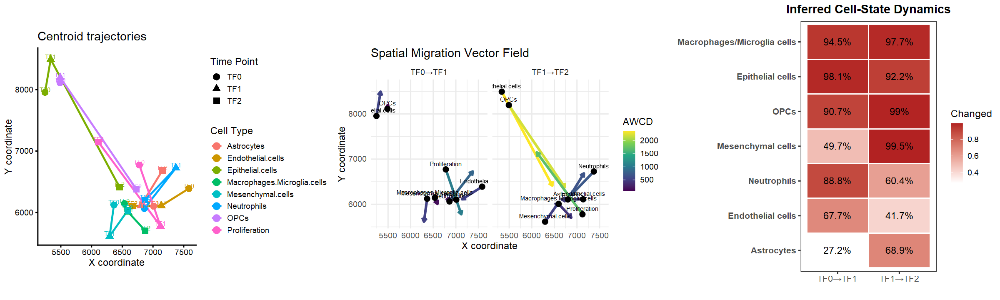

In [11]:
plot_all <- function(Centroids, AWCD, CellStateSummary, CellStateStats = NULL, patient_id, outdir = "./Final_outputs/", dpi = 600){
    if(!dir.exists(outdir))
        dir.create(outdir, recursive = TRUE)
    patient_dir <- file.path(outdir, patient_id)
    if (!dir.exists(patient_dir)) {dir.create(patient_dir, recursive = TRUE)}

    ## Plot centroid trajectories
    Centroids$Time <- factor(Centroids$Time, levels = unique(Centroids$Time))
    p1 <- ggplot(Centroids, aes(x = CentroidX, y = CentroidY, colour = CellType))+geom_path(aes(group = CellType),linewidth = 1) +
            geom_point(aes(shape = Time), size = 4) + geom_text(aes(label = Time), size = 3, nudge_y = 40, show.legend = FALSE) +
            coord_fixed() + theme_classic(base_size = 14) + labs(x = "X coordinate", y = "Y coordinate", colour = "Cell Type", shape = "Time Point") +
            labs(x = "X coordinate", y = "Y coordinate", title = "Centroid trajectories")
    ggsave(file.path(patient_dir, "CentTraj.png"), p1, width = 14, height = 10, dpi = dpi)
    
    ## Spatial Migration Vector Field
    tp <- unique(Centroids$Time)
    Vectors <- list()
    k <- 1
    for(ct in unique(Centroids$CellType)){
        tmp <- Centroids %>% filter(CellType == ct)
        if(nrow(tmp) < 2)
            next
        tmp <- tmp[match(tp,tmp$Time),]
        for(i in 1:(nrow(tmp)-1)){
            if(any(is.na(tmp$CentroidX[c(i,i+1)])))
                next
            dx <- tmp$CentroidX[i+1]-tmp$CentroidX[i]
            dy <- tmp$CentroidY[i+1]-tmp$CentroidY[i]
            dist <- sqrt(dx^2+dy^2)
            
            Vectors[[k]] <- data.frame(CellType = ct, Interval = paste(tmp$Time[i], tmp$Time[i+1], sep="→"),
                                       x0 = tmp$CentroidX[i], y0 = tmp$CentroidY[i], x1 = tmp$CentroidX[i+1], y1 = tmp$CentroidY[i+1],
                                       Distance = dist, stringsAsFactors = FALSE)
            k <- k+1
        }
    }
    Vectors <- bind_rows(Vectors)
    p2 <- ggplot(Vectors, aes(x = x0, y = y0)) + geom_segment(aes(xend = x1, yend = y1, colour = Distance),
                                                             arrow = arrow(length = unit(0.22,"cm")), linewidth = 1.3) +
            geom_point(size = 3, colour = "black") + geom_text(aes(label = CellType), nudge_y = 120, size = 3) +
            facet_wrap(~Interval) + coord_equal() + scale_colour_viridis_c(option = "D", name = "AWCD") +
            theme_bw(base_size = 13) + theme(panel.grid = element_blank(), plot.title = element_text(face = "bold", hjust = 0.5), 
                                             legend.position = "right") + theme_minimal(base_size = 14) +
            labs(x = "X coordinate", y = "Y coordinate", title = "Spatial Migration Vector Field")
    ggsave(file.path(patient_dir, "MigVector.png"), p2, width = 14, height = 10, dpi = dpi)
    
    ## Inferred Cell-State Dynamics Heatmap
    DF <- CellStateSummary
    if(!is.null(CellStateStats)){
        DF <- DF %>% left_join(CellStateStats %>% select(CellType, FDR), by = c("BaselineCellType"="CellType"))                  ## Add FDR
        DF$Significance <- ifelse(is.na(DF$FDR),"", ifelse(DF$FDR < 0.001,"***", ifelse(DF$FDR < 0.01,"**", ifelse(DF$FDR < 0.05,"*",""))))
    }else{
        DF$Significance <- ""
    }
    p3 <- ggplot(DF, aes(x = Interval, y = reorder(BaselineCellType, ProportionChanged), fill = ProportionChanged))+
            geom_tile(colour = "white", linewidth = 0.6) + 
            geom_text(aes(label = paste0(round(100*ProportionChanged, 1), "%")), size = 5, vjust = 0.5, hjust = 0.5, position = position_nudge(x = 0, y = 0)) +   
            scale_fill_gradient(low = "white", high = "firebrick", name = "Changed") +
            theme_bw(base_size = 14) + labs(x = "", y = "", title = "Inferred Cell-State Dynamics") +
            theme(panel.grid = element_blank(), axis.text.y = element_text(size = 12, face="bold"), axis.text.x = element_text(size = 12),
                  plot.title = element_text(face = "bold", hjust = 0.5), legend.position = "right")    
    ggsave(file.path(patient_dir, "CellstateHeatmap.png"), p3, width = 14, height = 10, dpi = dpi, scale = 0.6)

    options(repr.plot.height = 6, repr.plot.width = 20)
    p_combined <- plot_grid(p1, p2, p3, ncol = 3)
    #ggsave(file.path(outdir, "All_plots_combined.png"), p_combined, width = 30, height = 8, dpi = dpi, scale = 1.4)
    print(p_combined)
}
plot_all(Centroids, AWCD, CellStateSummary, CellStateStats = NULL, patient_id = patient$patient_id, dpi = 600)

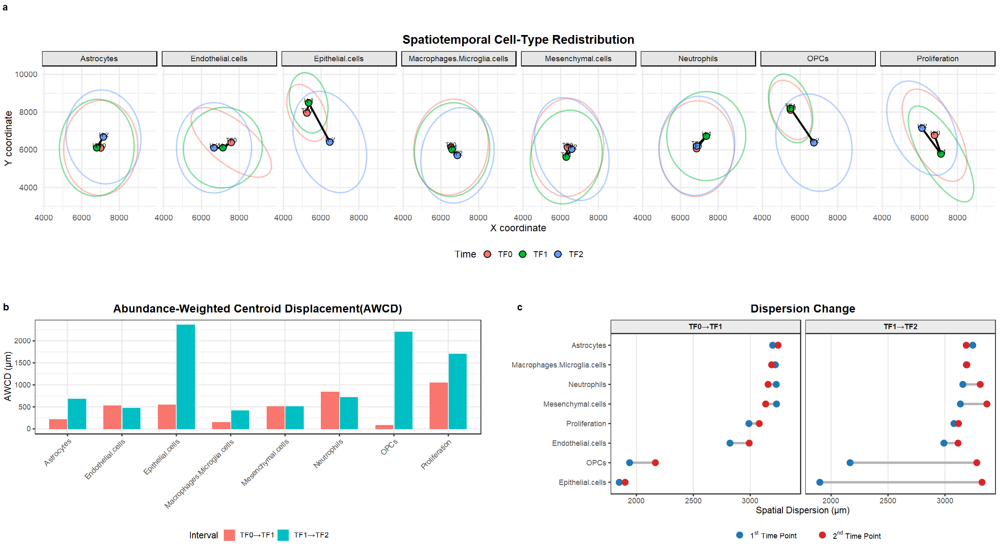

In [31]:
## Spatiotemporal Cell-Type Redistribution
plot_combined <- function(Centroids, AWCD, patient_id, outdir = "./Final_outputs/", width = 12, height = 10, dpi = 600){
    if(!dir.exists(outdir))
        dir.create(outdir, recursive = TRUE)
    patient_dir <- file.path(outdir, patient_id)
    if (!dir.exists(patient_dir)) {dir.create(patient_dir, recursive = TRUE)}

    ## ---------- Ellipse data ----------
    ellipse_df <- list()
    k <- 1
    for(i in seq_len(nrow(Centroids))){
        row <- Centroids[i,]
        theta <- seq(0, 2*pi, length.out = 150)

        a <- row$MajorAxis
        b <- row$MinorAxis

        phi <- row$Angle*pi/180

        xx <- a*cos(theta)
        yy <- b*sin(theta)

        xr <- xx*cos(phi)-yy*sin(phi)
        yr <- xx*sin(phi)+yy*cos(phi)

        ellipse_df[[k]] <- data.frame(x = xr + row$CentroidX, y = yr + row$CentroidY, CellType = row$CellType, Time = row$Time, stringsAsFactors = FALSE)
        k <- k+1
    }
    Ellipses <- bind_rows(ellipse_df)

    ## ---------- Trajectory ----------
    Centroids$Time <- factor(Centroids$Time, levels = unique(Centroids$Time))
    p_spatio <- ggplot() + geom_path(data = Ellipses, aes(x = x, y = y, colour = Time, group = interaction(CellType,Time)), linewidth = 0.7, alpha = 0.45) +
                    geom_path(data = Centroids, aes(x = CentroidX, y = CentroidY, group = CellType), 
                              arrow = arrow(length = unit(0.18,"cm")), linewidth = 1, colour = "black") +
                    geom_point(data = Centroids, aes(CentroidX, CentroidY, fill = Time), shape = 21, size = 3.8, colour = "black") +
                    geom_text(data = Centroids, aes(CentroidX, CentroidY, label = Time), size = 3, nudge_y = 120, show.legend = FALSE) +
                    facet_wrap(~CellType, nrow = 1) + coord_equal() + theme_minimal(base_size = 14) +
                    labs(x = "X coordinate", y = "Y coordinate", fill = "Time", colour = "Time", title = "Spatiotemporal Cell-Type Redistribution") +
                    theme(strip.background = element_rect(fill="grey90"), legend.position = "bottom", 
                          plot.title = element_text(hjust = 0.5, face = "bold"))

    ## Panel A : AWCD
    p_awcd <- ggplot(AWCD$Table, aes(CellType, AWCD, fill = Interval)) + geom_col(position = position_dodge(0.7), width = 0.65) +
            theme_bw(base_size = 13) + labs(x = "", y = "AWCD (µm)", fill = "Interval", title = "Abundance-Weighted Centroid Displacement(AWCD)") +
            theme(axis.text.x = element_text(angle = 45, hjust = 1), legend.position = "bottom", plot.title = element_text(face = "bold", hjust = 0.5))
    
    ## Panel B : Dispersion
    DispersionDF <- AWCD$Table %>% select(CellType, Interval, Dispersion_T1, Dispersion_T2) #%>%
                                    #pivot_longer(cols = c(Dispersion_T1, Dispersion_T2), names_to = "Time", values_to = "Dispersion")
    p_disp <- ggplot(DispersionDF, aes(y = reorder(CellType, Dispersion_T1))) + 
                geom_segment(aes(x = Dispersion_T1, xend = Dispersion_T2, yend = CellType), colour = "grey70", linewidth = 1.2) +
                geom_point(aes(x = Dispersion_T1, color = "T1"), size = 3.5) +
                geom_point(aes(x = Dispersion_T2, color = "T2"), size = 3.5) + 
                scale_color_manual(values = c("T1" = "#1F77B4", "T2" = "#D62728"), name = "", 
                                   labels = c("T1" = expression(paste(1^st, " Time Point          ")), "T2" = expression(paste(2^nd, " Time Point")))) + 
                                   facet_wrap(~Interval, nrow = 1) +
                labs(x = "Spatial Dispersion (µm)", y = NULL, title = "Dispersion Change") + theme_bw(base_size = 13) +
                theme(panel.grid.major.y = element_blank(), panel.grid.minor = element_blank(), strip.background = element_rect(fill = "grey92"),
                      strip.text = element_text(face = "bold"), plot.title = element_text(face = "bold", hjust = 0.5), legend.position = "bottom")

    bottom_row <- plot_grid(p_awcd, NULL, p_disp, ncol = 3, rel_widths = c(1, 0.06, 1), labels = c("b", "", "c"), label_size = 14)

    options(repr.plot.height = 11, repr.plot.width = 20)
    final_plot <- plot_grid(p_spatio, bottom_row, ncol = 1, rel_heights = c(1.2, 1), labels = c("a", ""), label_size = 14)
    ggsave(file.path(patient_dir, "Spatiotemporal_AWCD_Dispersion.png"), final_plot, width = width, height = height, dpi = dpi)
    return(final_plot)
}
plot_combined(Centroids, AWCD, patient_id = patient$patient_id)